
===== TRAIN DATA INFO =====
Shape: (175338, 33)
Columns: ['Time', 'BidPrice_5', 'BidPrice_4', 'BidPrice_3', 'BidPrice_2', 'BidPrice_1', 'BidSize_5', 'BidSize_4', 'BidSize_3', 'BidSize_2', 'BidSize_1', 'AskPrice_1', 'AskPrice_2', 'AskPrice_3', 'AskPrice_4', 'AskPrice_5', 'AskSize_1', 'AskSize_2', 'AskSize_3', 'AskSize_4', 'AskSize_5', 'OrderID', 'Size', 'Price', 'Direction_1=Buy_-1=Sell', 'NewLimitOrder_1=Yes_0=No', 'PartialCancel_1=Yes_0=No', 'FullDelete_1=Yes_0=No', 'VisibleExecution_1=Yes_0=No', 'HiddenExecution_1=Yes_0=No', 'TradingHalt_1=Yes_0=No', 'Spread', 'MidPrice']

===== HEAD (10 ROWS) =====
           Time  BidPrice_5  BidPrice_4  BidPrice_3  BidPrice_2  BidPrice_1  \
0  09:30:00.017      222.62      223.00      223.04      223.07      223.18   
1  09:30:00.189      223.00      223.04      223.07      223.18      223.81   
2  09:30:00.189      223.00      223.04      223.07      223.18      223.81   
3  09:30:00.189      223.04      223.07      223.18      223.75      223.8

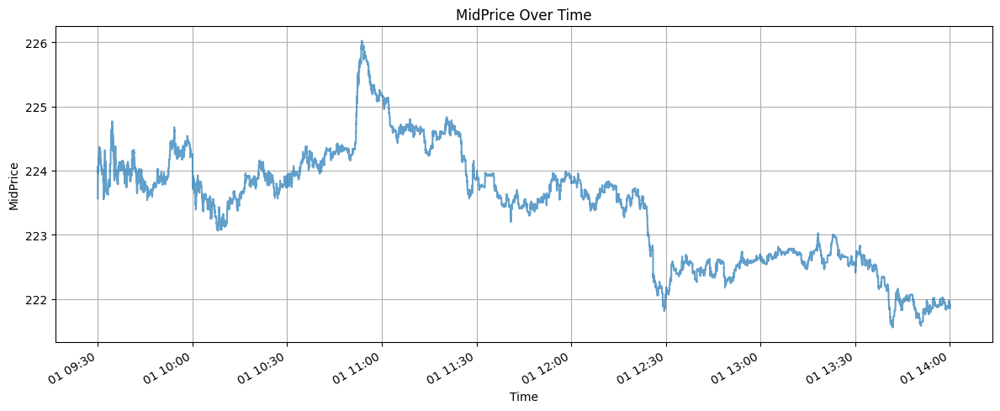

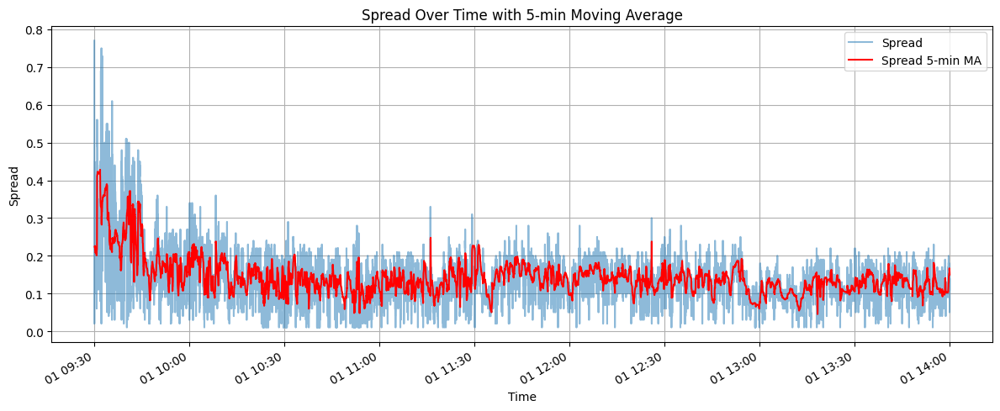

/tmp/ipykernel_155/3452193371.py:128: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=event_labels, y=event_counts_clean.values, palette=colors)


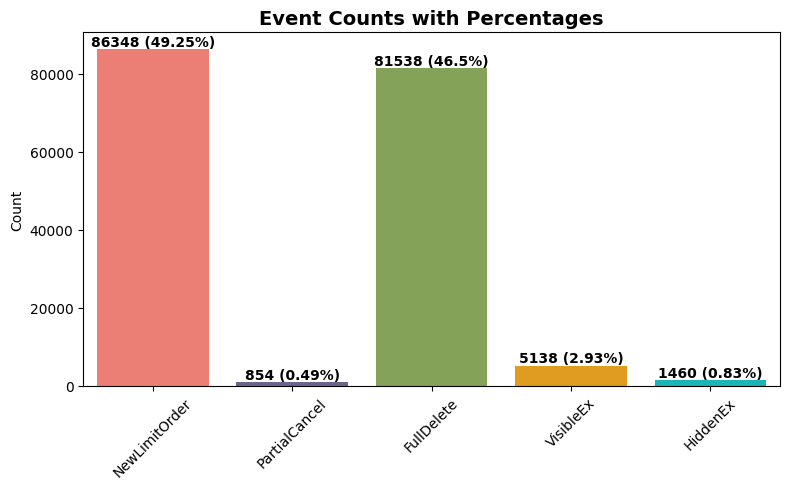

/tmp/ipykernel_155/3452193371.py:153: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=direction_labels, y=direction_counts.values, palette=direction_colors)


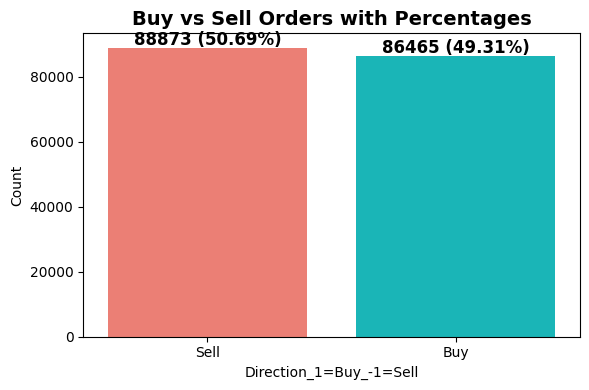

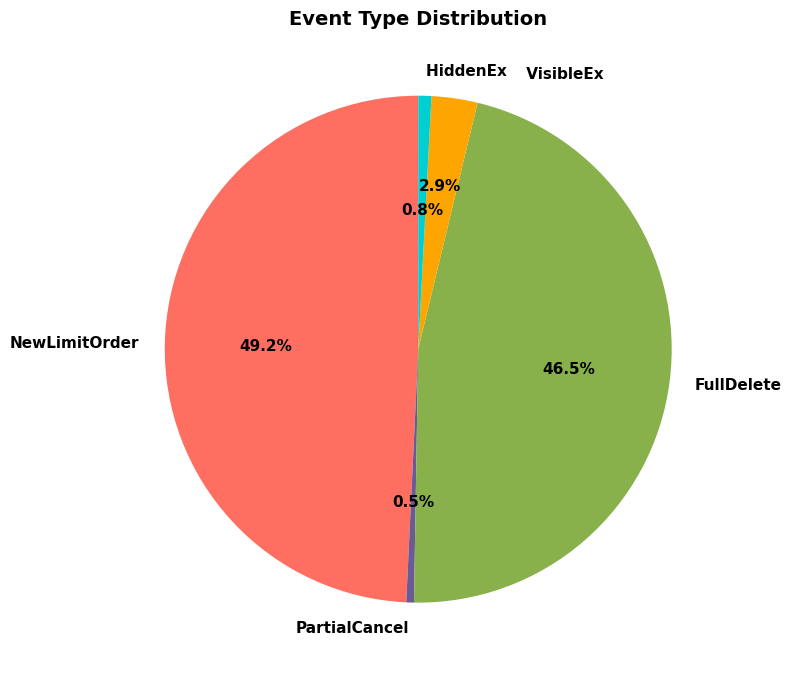

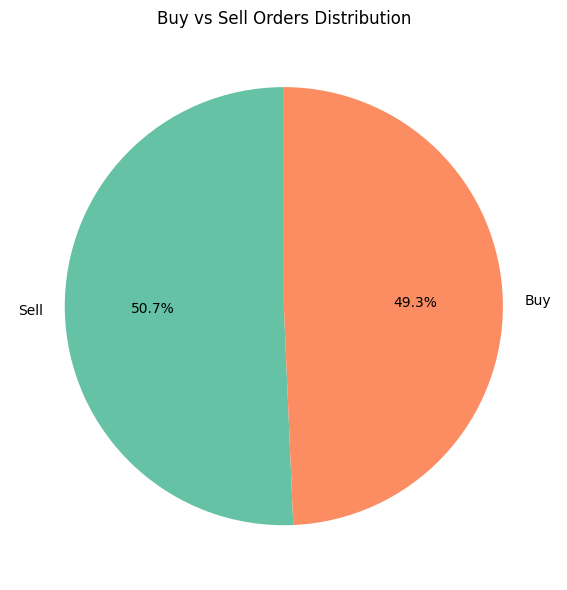

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------
# Show ALL columns in prints
# -----------------------------
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

# -----------------------------
# 1. Read CSV
# -----------------------------
train_read = pd.read_csv("AMZN_5levels_train.csv")
# train_read = pd.read_csv("GOOG_5levels_train.csv")
# train_read = pd.read_csv("INTC_5levels_train.csv")
# train_read = pd.read_csv("MSFT_5levels_train.csv")

# -----------------------------
# 2. Basic info
# -----------------------------
print("\n===== TRAIN DATA INFO =====")
print("Shape:", train_read.shape)
print("Columns:", train_read.columns.tolist())

print("\n===== HEAD (10 ROWS) =====")
print(train_read.head(10))

print("\n===== SPREAD & MIDPRICE STATS =====")
print(train_read[["Spread","MidPrice"]].describe())

event_cols = [
    "NewLimitOrder_1=Yes_0=No",
    "PartialCancel_1=Yes_0=No",
    "FullDelete_1=Yes_0=No",
    "VisibleExecution_1=Yes_0=No",
    "HiddenExecution_1=Yes_0=No",
    "TradingHalt_1=Yes_0=No"
]

print("\n===== EVENT COUNTS =====")
for c in event_cols:
    print(f"{c}: {train_read[c].sum()}")

print("\n===== DIRECTION COUNTS =====")
print(train_read["Direction_1=Buy_-1=Sell"].value_counts())

print("\n===== TIME RANGE =====")
print("First timestamp:", train_read["Time"].iloc[0])
print("Last timestamp: ", train_read["Time"].iloc[-1])

# -----------------------------
# 3. Convert Time to proper datetime with milliseconds preserved
# -----------------------------
# Assuming Time column is in "HH:MM:SS.mmm" format
train_read["Time_dt"] = pd.to_datetime(train_read["Time"], format="%H:%M:%S.%f", errors='coerce')

# Check if any rows failed to parse
if train_read["Time_dt"].isna().any():
    print("Warning: Some timestamps failed to parse. Check Time column format.")

train_read.set_index("Time_dt", inplace=True)

# -----------------------------
# 4. MidPrice over time
# -----------------------------
plt.figure(figsize=(12,5))
plt.plot(train_read.index, train_read["MidPrice"], label="MidPrice", alpha=0.7)
plt.title("MidPrice Over Time")
plt.xlabel("Time")
plt.ylabel("MidPrice")
plt.xticks(rotation=45)
plt.gcf().autofmt_xdate()
plt.grid(True)
plt.tight_layout()
plt.show()

# -----------------------------
# 5. Spread with 5-min moving average
# -----------------------------
spread_5min_ma = train_read["Spread"].rolling(window=300).mean()  # 300 rows ~ 5 min if per second

plt.figure(figsize=(12,5))
plt.plot(train_read.index, train_read["Spread"], label="Spread", alpha=0.5)
plt.plot(train_read.index, spread_5min_ma, label="Spread 5-min MA", color="red")
plt.title("Spread Over Time with 5-min Moving Average")
plt.xlabel("Time")
plt.ylabel("Spread")
plt.legend()
plt.xticks(rotation=45)
plt.gcf().autofmt_xdate()
plt.grid(True)
plt.tight_layout()
plt.show()



# -----------------------------
# 6. Event counts (%) visualization (updated colors & labels)
# -----------------------------
# Keep only relevant event columns
event_cols_clean = [
    "NewLimitOrder_1=Yes_0=No",
    "PartialCancel_1=Yes_0=No",
    "FullDelete_1=Yes_0=No",
    "VisibleExecution_1=Yes_0=No",
    "HiddenExecution_1=Yes_0=No"
]

# Sum counts and percentages
event_counts_clean = train_read[event_cols_clean].sum()
event_percent_clean = (event_counts_clean / len(train_read) * 100).round(2)

# Custom labels
event_labels = [
    "NewLimitOrder",
    "PartialCancel",
    "FullDelete",
    "VisibleEx",
    "HiddenEx"
]

# Vibrant colors
colors = ["#FF6F61", "#6B5B95", "#88B04B", "#FFA500", "#00CED1"]

plt.figure(figsize=(8,5))
sns.barplot(x=event_labels, y=event_counts_clean.values, palette=colors)
for i, col in enumerate(event_counts_clean.index):
    plt.text(i, event_counts_clean[col] + max(event_counts_clean.values)*0.01,
             f"{event_counts_clean[col]} ({event_percent_clean[col]}%)",
             ha='center', fontsize=10, weight='bold')
plt.xticks(rotation=45)
plt.ylabel("Count")
plt.title("Event Counts with Percentages", fontsize=14, weight='bold')
plt.tight_layout()
plt.show()


# -----------------------------
# 7. Buy vs Sell counts (%) visualization (updated colors)
# -----------------------------
direction_counts = train_read["Direction_1=Buy_-1=Sell"].value_counts()
direction_percent = (direction_counts / len(train_read) * 100).round(2)

# Map to Buy/Sell labels
direction_labels = direction_counts.index.map({1:"Buy", -1:"Sell"})

# Vibrant colors (matching event chart theme)
direction_colors = ["#FF6F61", "#00CED1"]  # Buy = red-orange, Sell = cyan

plt.figure(figsize=(6,4))
sns.barplot(x=direction_labels, y=direction_counts.values, palette=direction_colors)
for i, direction in enumerate(direction_counts.index):
    plt.text(i, direction_counts[direction] + max(direction_counts.values)*0.01,
             f"{direction_counts[direction]} ({direction_percent[direction]}%)",
             ha='center', fontsize=12, weight='bold')
plt.ylabel("Count")
plt.title("Buy vs Sell Orders with Percentages", fontsize=14, weight='bold')
plt.tight_layout()
plt.show()

# -----------------------------
# 8. Pie Chart for Event Types (vibrant colors + adjusted percentages)
# -----------------------------
# Keep only relevant event columns
event_cols_clean = [
    "NewLimitOrder_1=Yes_0=No",
    "PartialCancel_1=Yes_0=No",
    "FullDelete_1=Yes_0=No",
    "VisibleExecution_1=Yes_0=No",
    "HiddenExecution_1=Yes_0=No"
]

# Sum counts
event_counts_clean = train_read[event_cols_clean].sum()

# Custom short names
event_labels = [
    "NewLimitOrder",
    "PartialCancel",
    "FullDelete",
    "             VisibleEx",
    "HiddenEx          "
]

# Vibrant colors (matching bar chart)
colors = ["#FF6F61", "#6B5B95", "#88B04B", "#FFA500", "#00CED1"]

# Create pie chart
plt.figure(figsize=(8,8))
wedges, texts, autotexts = plt.pie(
    event_counts_clean,
    labels=event_labels,
    autopct='%1.1f%%',
    startangle=90,
    colors=colors,
    textprops={'fontsize': 11, 'weight':'bold'}
)

# Adjust overlapping percentages for VisibleEx and HiddenEx
for i, label in enumerate(event_labels):
    if label == "             VisibleEx":
        autotexts[i].set_y(autotexts[i].get_position()[1] + 0.05)  # move outward
    elif label == "HiddenEx          ":
        autotexts[i].set_y(autotexts[i].get_position()[1] - 0.05)  # move inward

plt.title("Event Type Distribution", fontsize=14, weight='bold')
plt.tight_layout()
plt.show()

# -----------------------------
# 9. Pie Chart for Buy vs Sell Directions
# -----------------------------
plt.figure(figsize=(6,6))
plt.pie(direction_counts, labels=direction_counts.index.map({1:"Buy", -1:"Sell"}), autopct='%1.1f%%', startangle=90, colors=sns.color_palette("Set2", len(direction_counts)))
plt.title("Buy vs Sell Orders Distribution")
plt.tight_layout()
plt.show()

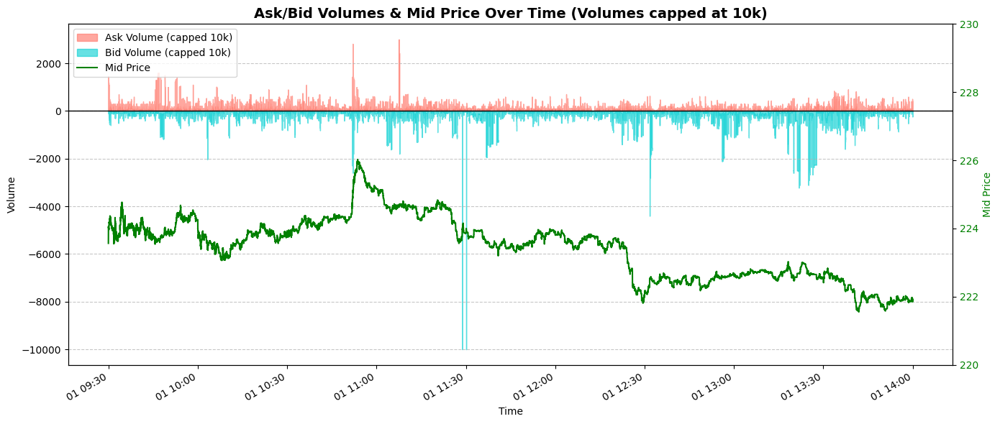

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------
# Cap volumes for plotting
# -----------------------------
ask_vol_plot = train_read["AskSize_1"].clip(upper=10000)
bid_vol_plot = train_read["BidSize_1"].clip(upper=10000)
mid_price = train_read["MidPrice"]

# -----------------------------
# Plot volumes and mid price
# -----------------------------
fig, ax1 = plt.subplots(figsize=(14,6))

# -----------------------------
# Bid/Ask Volume (primary y-axis)
# -----------------------------
ax1.fill_between(train_read.index, 0, ask_vol_plot,
                 color="#FF6F61", alpha=0.6, label="Ask Volume (capped 10k)")
ax1.fill_between(train_read.index, 0, -bid_vol_plot,
                 color="#00CED1", alpha=0.6, label="Bid Volume (capped 10k)")

ax1.axhline(0, color='black', linewidth=1)  # zero line
ax1.set_xlabel("Time")
ax1.set_ylabel("Volume")
ax1.tick_params(axis='y', labelcolor='black')
ax1.grid(True, axis='y', linestyle='--', alpha=0.7)

# -----------------------------
# Mid Price (secondary y-axis)
# -----------------------------
ax2 = ax1.twinx()  # create secondary axis
ax2.plot(train_read.index, mid_price, color='green', linewidth=1.5, label="Mid Price")
ax2.set_ylabel("Mid Price", color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Set fixed y-axis limits for price
ax2.set_ylim(220, 230)

# -----------------------------
# Combine legends
# -----------------------------
lines_labels = [ax.get_legend_handles_labels() for ax in [ax1, ax2]]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
ax1.legend(lines, labels, loc='upper left')

# -----------------------------
# Formatting
# -----------------------------
plt.title("Ask/Bid Volumes & Mid Price Over Time (Volumes capped at 10k)", fontsize=14, weight='bold')
plt.xticks(rotation=45)
plt.gcf().autofmt_xdate()
plt.tight_layout()
plt.show()

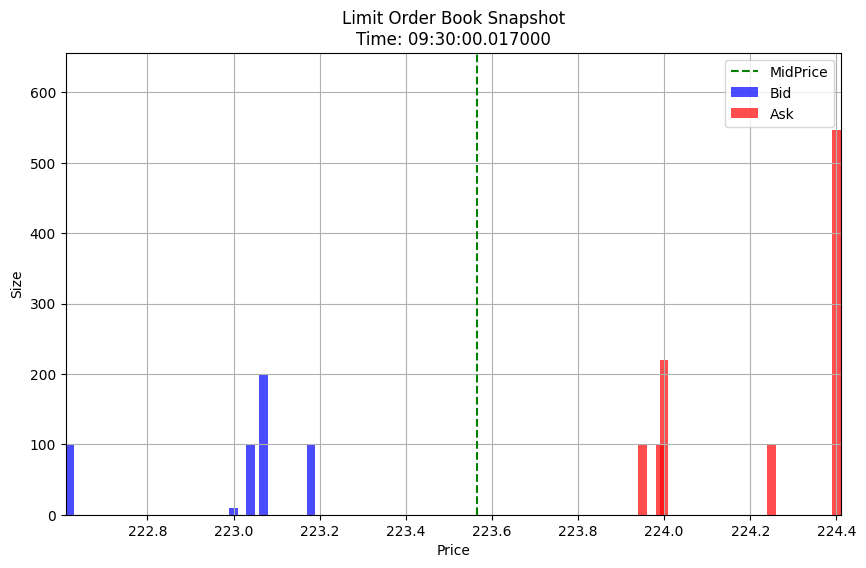

In [ ]:
import matplotlib.pyplot as plt

# -----------------------------
# Columns for top 5 levels
# -----------------------------
bid_prices = ['BidPrice_1', 'BidPrice_2', 'BidPrice_3', 'BidPrice_4', 'BidPrice_5']
bid_sizes  = ['BidSize_1', 'BidSize_2', 'BidSize_3', 'BidSize_4', 'BidSize_5']
ask_prices = ['AskPrice_1', 'AskPrice_2', 'AskPrice_3', 'AskPrice_4', 'AskPrice_5']
ask_sizes  = ['AskSize_1', 'AskSize_2', 'AskSize_3', 'AskSize_4', 'AskSize_5']

# -----------------------------
# Take a snapshot (first row)
# -----------------------------
row = train_read.iloc[0]

bid_p = row[bid_prices].values
bid_s = row[bid_sizes].values
ask_p = row[ask_prices].values
ask_s = row[ask_sizes].values
mid_price = row["MidPrice"]

# -----------------------------
# Static LOB plot
# -----------------------------
plt.figure(figsize=(10,6))
plt.bar(bid_p, bid_s, width=0.02, color='blue', alpha=0.7, label='Bid')
plt.bar(ask_p, ask_s, width=0.02, color='red', alpha=0.7, label='Ask')

# MidPrice dashed line
plt.axvline(mid_price, color='green', linestyle='--', linewidth=1.5, label='MidPrice')

plt.xlabel("Price")
plt.ylabel("Size")
plt.title(f"Limit Order Book Snapshot\nTime: {row.name.time()}")
plt.legend()
plt.grid(True)

# Set x-axis limits with small margin
plt.xlim(min(bid_p.min(), ask_p.min())-0.01, max(bid_p.max(), ask_p.max())+0.01)
plt.ylim(0, max(bid_s.max(), ask_s.max(), 1)*1.2)

plt.show()

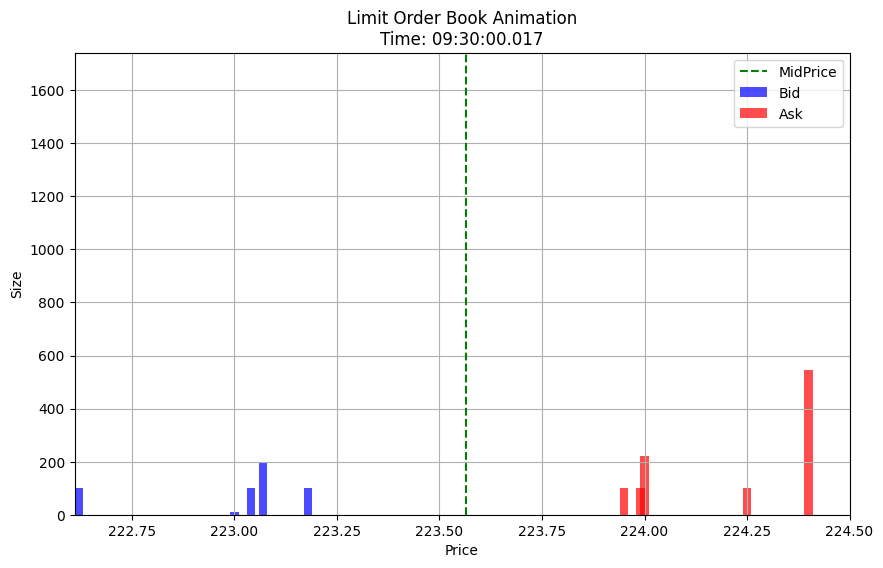

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# -----------------------------
# 1. Read CSV
# -----------------------------
train_read = pd.read_csv("AMZN_5levels_train.csv")

# -----------------------------
# 2. Columns for top 5 levels
# -----------------------------
bid_prices = ['BidPrice_1', 'BidPrice_2', 'BidPrice_3', 'BidPrice_4', 'BidPrice_5']
bid_sizes  = ['BidSize_1', 'BidSize_2', 'BidSize_3', 'BidSize_4', 'BidSize_5']
ask_prices = ['AskPrice_1', 'AskPrice_2', 'AskPrice_3', 'AskPrice_4', 'AskPrice_5']
ask_sizes  = ['AskSize_1', 'AskSize_2', 'AskSize_3', 'AskSize_4', 'AskSize_5']

# -----------------------------
# 3. Convert Time to datetime with milliseconds
# -----------------------------
train_read["Time_dt"] = pd.to_datetime(train_read["Time"], format="%H:%M:%S.%f", errors='coerce')

# Check for parsing issues
if train_read["Time_dt"].isna().any():
    print("Warning: Some timestamps failed to parse. Check Time column format.")

train_read.set_index("Time_dt", inplace=True)

# -----------------------------
# 4. Use first N rows for animation
# -----------------------------
N = 300  # adjust for short demo
df = train_read.iloc[:N].copy()

# -----------------------------
# 5. Prepare figure
# -----------------------------
fig, ax = plt.subplots(figsize=(10,6))

# Compute safe axis limits
all_prices = pd.concat([df[bid_prices], df[ask_prices]])
all_sizes  = pd.concat([df[bid_sizes], df[ask_sizes]])

x_min, x_max = all_prices.min().min() - 0.01, all_prices.max().max() + 0.01
y_max = all_sizes.max().max()
if pd.isna(y_max) or y_max == 0:
    y_max = 1
y_max *= 1.2

ax.set_xlim(x_min, x_max)
ax.set_ylim(0, y_max)
ax.set_xlabel("Price")
ax.set_ylabel("Size")
ax.set_title("Limit Order Book Animation")
ax.grid(True)

# -----------------------------
# 6. Animation function
# -----------------------------
def update(frame):
    row = df.iloc[frame]
    bid_p = row[bid_prices].values
    bid_s = row[bid_sizes].values
    ask_p = row[ask_prices].values
    ask_s = row[ask_sizes].values
    mid_price = row["MidPrice"]

    ax.clear()
    ax.bar(bid_p, bid_s, width=0.02, color='blue', alpha=0.7, label='Bid')
    ax.bar(ask_p, ask_s, width=0.02, color='red', alpha=0.7, label='Ask')
    ax.axvline(mid_price, color='green', linestyle='--', linewidth=1.5, label='MidPrice')

    ax.set_xlabel("Price")
    ax.set_ylabel("Size")
    ax.set_title(f"Limit Order Book Animation\nTime: {row.name.strftime('%H:%M:%S.%f')[:-3]}")
    ax.legend()
    ax.grid(True)
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(0, y_max)

# -----------------------------
# 7. Run animation and display in Colab
# -----------------------------
ani = FuncAnimation(fig, update, frames=N, interval=200)

# Display inline in Colab
HTML(ani.to_jshtml())


Rows after 1PM: 32542

===== TABLE 1A: BID SIDE =====
        Time  BidPrice_5  BidSize_5  BidPrice_4  BidSize_4  BidPrice_3  BidSize_3  BidPrice_2  BidSize_2  BidPrice_1  BidSize_1
13:00:00.211      222.55         15      222.56         12      222.57        100      222.59        171       222.6         23
13:00:00.212      222.55         15      222.56         12      222.57        100      222.59        171       222.6         23
13:00:00.218      222.55         15      222.56         12      222.57        100      222.59        171       222.6         23
13:00:00.220      222.54       1045      222.55         15      222.57        100      222.59        171       222.6         23
13:00:00.222      222.54       1045      222.55         15      222.57        100      222.59        156       222.6         23
13:00:00.222      222.54       1045      222.55         15      222.57        100      222.59        156       222.6         23
13:00:00.229      222.54       1045      222.55  

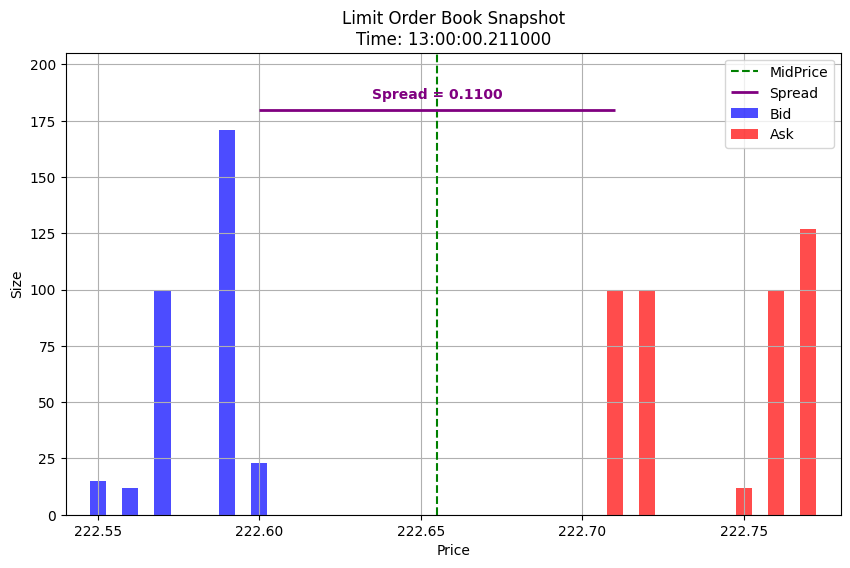

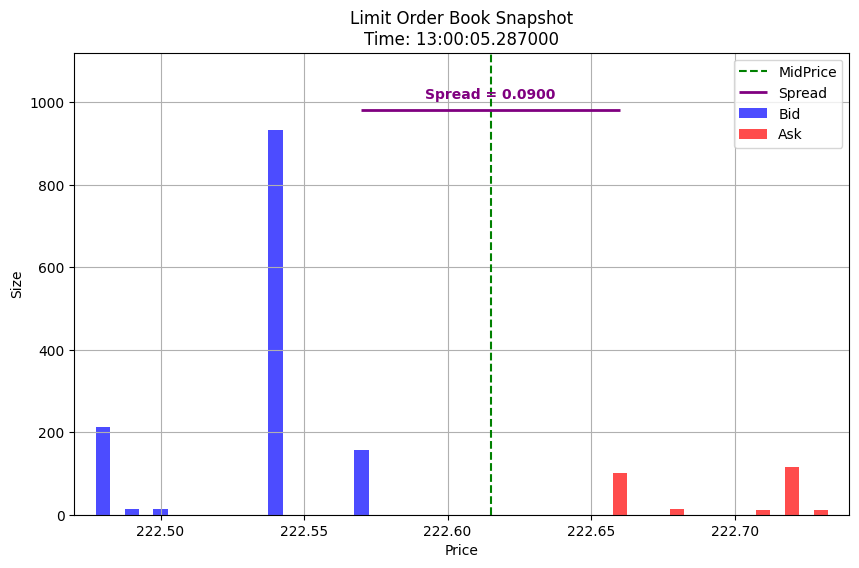

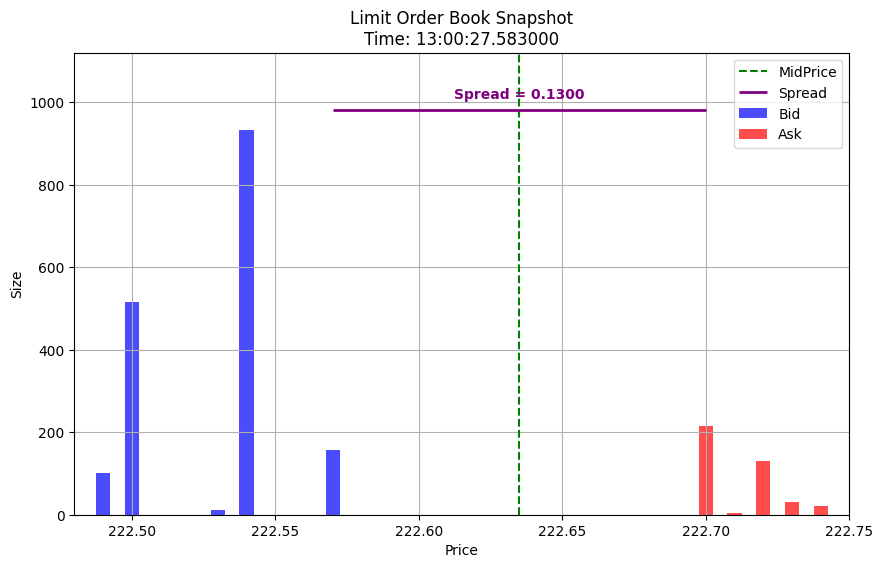

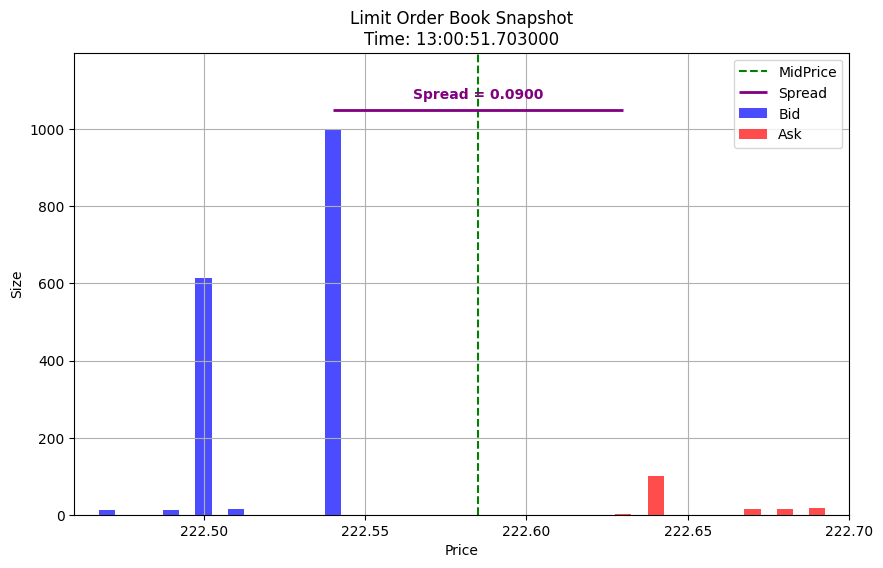

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------
# Display settings
# -----------------------------
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)

# -----------------------------
# 1. Read CSV
# -----------------------------
train_read = pd.read_csv("AMZN_5levels_train.csv")

# -----------------------------
# 2. Convert time
# -----------------------------
train_read["Time_dt"] = pd.to_datetime(train_read["Time"], format="%H:%M:%S.%f", errors="coerce")
train_read.set_index("Time_dt", inplace=True)

# -----------------------------
# 3. Filter data starting 1PM
# -----------------------------
after_1pm = train_read[train_read.index.time >= pd.to_datetime("13:00:00").time()]
print("\nRows after 1PM:", len(after_1pm))


# =========================================================
# TABLE 1 — SPLIT INTO BID & ASK (INCLUDE TIME)
# =========================================================

bid_cols = ["Time"] + [
    'BidPrice_5','BidSize_5',
    'BidPrice_4','BidSize_4',
    'BidPrice_3','BidSize_3',
    'BidPrice_2','BidSize_2',
    'BidPrice_1','BidSize_1'
]

ask_cols = ["Time"] + [
    'AskPrice_1','AskSize_1',
    'AskPrice_2','AskSize_2',
    'AskPrice_3','AskSize_3',
    'AskPrice_4','AskSize_4',
    'AskPrice_5','AskSize_5'
]

# Reset index to get Time as a column
after_1pm_reset = after_1pm.reset_index()

table1_bid = after_1pm_reset[bid_cols].copy()
table1_ask = after_1pm_reset[ask_cols].copy()

print("\n===== TABLE 1A: BID SIDE =====")
print(table1_bid.head(10).to_string(index=False))

print("\n===== TABLE 1B: ASK SIDE =====")
print(table1_ask.head(10).to_string(index=False))


# =========================================================
# TABLE 2 — PRICE LEVELS + MID/SPREAD (INCLUDE TIME)
# =========================================================

table2_cols = ["Time"] + [
    'BidPrice_5','BidPrice_4','BidPrice_3','BidPrice_2','BidPrice_1',
    'MidPrice','Spread',
    'AskPrice_1','AskPrice_2','AskPrice_3','AskPrice_4','AskPrice_5'
]

table2 = after_1pm_reset[table2_cols].copy()
table2["MidPrice"] = table2["MidPrice"].round(2)
table2["Spread"] = table2["Spread"].round(4)

print("\n===== TABLE 2: PRICE LEVELS =====")
print(table2.head(10).to_string(index=False))


# =========================================================
# TABLE 3 — EVENTS (REORDER COLUMNS)
# =========================================================

# Columns we want first
primary_cols = ["Time", "OrderID", "Size", "Price"]

# Other event columns
other_cols = [
    "Direction_1=Buy_-1=Sell",
    "NewLimitOrder_1=Yes_0=No",
    "PartialCancel_1=Yes_0=No",
    "FullDelete_1=Yes_0=No",
    "VisibleExecution_1=Yes_0=No",
    "HiddenExecution_1=Yes_0=No",
    "TradingHalt_1=Yes_0=No"
]

# Combine for final table3
table3_cols = primary_cols + other_cols
table3 = after_1pm_reset[table3_cols].copy()

print("\n===== TABLE 3: EVENTS =====")
print(table3.head(15).to_string(index=False))


# =========================================================
# LOB SNAPSHOT PLOTS (EXACT STYLE YOU PROVIDED)
# =========================================================

# Columns for top 5 levels
bid_prices = ['BidPrice_1','BidPrice_2','BidPrice_3','BidPrice_4','BidPrice_5']
bid_sizes  = ['BidSize_1','BidSize_2','BidSize_3','BidSize_4','BidSize_5']

ask_prices = ['AskPrice_1','AskPrice_2','AskPrice_3','AskPrice_4','AskPrice_5']
ask_sizes  = ['AskSize_1','AskSize_2','AskSize_3','AskSize_4','AskSize_5']

def plot_lob_snapshot(row):

    # Extract prices and sizes
    bid_p = row[bid_prices].values
    bid_s = row[bid_sizes].values

    ask_p = row[ask_prices].values
    ask_s = row[ask_sizes].values

    mid_price = row["MidPrice"]

    # Compute spread
    best_bid = bid_p.max()
    best_ask = ask_p.min()
    spread = best_ask - best_bid

    # -----------------------------
    # Static LOB plot
    # -----------------------------
    plt.figure(figsize=(10,6))
    plt.bar(bid_p, bid_s, width=0.005, color='blue', alpha=0.7, label='Bid')
    plt.bar(ask_p, ask_s, width=0.005, color='red', alpha=0.7, label='Ask')

    # MidPrice dashed line
    plt.axvline(mid_price, color='green', linestyle='--', linewidth=1.5, label='MidPrice')

    # Spread line and text
    plt.hlines(y=max(bid_s.max(), ask_s.max())*1.05, xmin=best_bid, xmax=best_ask,
               color='purple', linestyle='-', linewidth=2, label='Spread')
    plt.text((best_bid+best_ask)/2, max(bid_s.max(), ask_s.max())*1.08,
             f"Spread = {spread:.4f}", color='purple', ha='center', fontsize=10, fontweight='bold')

    plt.xlabel("Price")
    plt.ylabel("Size")
    plt.title(f"Limit Order Book Snapshot\nTime: {row.name.time()}")
    plt.legend()
    plt.grid(True)

    # Set x-axis limits with small margin
    plt.xlim(min(bid_p.min(), ask_p.min()) - 0.01,
             max(bid_p.max(), ask_p.max()) + 0.01)

    plt.ylim(0, max(bid_s.max(), ask_s.max(), 1) * 1.2)

    plt.show()


# =========================================================
# Plot multiple snapshots
# =========================================================

print("\n===== LOB SNAPSHOTS =====")

snapshot_rows = [0, 50, 200, 500]

for i in snapshot_rows:
    if i < len(after_1pm):
        row = after_1pm.iloc[i]
        plot_lob_snapshot(row)

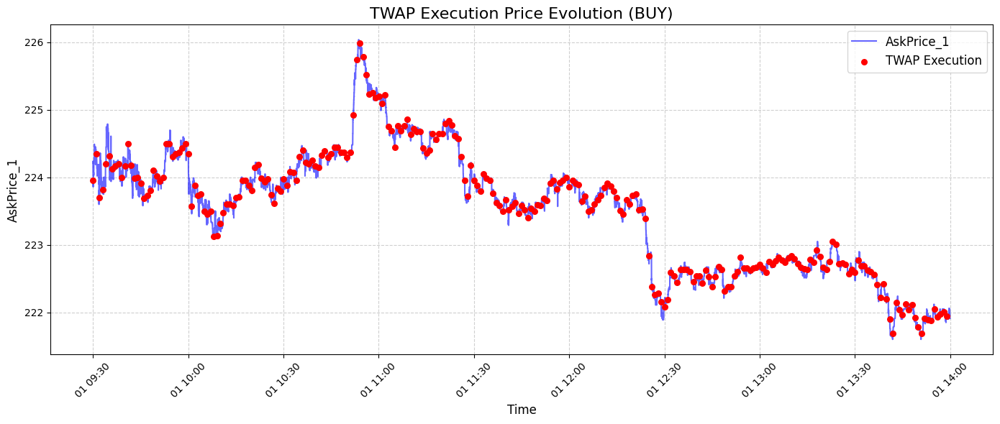

TWAP (BUY) Performance
Number of trades: 270
Average TWAP price: 223.51937
Min TWAP price: 221.69
Max TWAP price: 225.99


In [ ]:
# -----------------------------
# 1️⃣ TOGGLE BUY / SELL
# -----------------------------
TWAP_SIDE = "BUY"
# TWAP_SIDE = "SELL"

# -----------------------------
# 2️⃣ EXECUTION PRICE COLUMN
# -----------------------------
if TWAP_SIDE == "BUY":
    execution_price_col = "AskPrice_1"
else:
    execution_price_col = "BidPrice_1"

# -----------------------------
# 3️⃣ GROUP DATA BY MINUTE
# -----------------------------
train_read["Minute"] = train_read.index.floor("min")
minute_groups = train_read.groupby("Minute")

# -----------------------------
# 4️⃣ TWAP EXECUTION PRICES
# -----------------------------
twap_prices = []
twap_times = []

for minute, group in minute_groups:
    twap_price = group.iloc[0][execution_price_col]
    twap_prices.append(twap_price)
    twap_times.append(group.index[0])

twap_prices = pd.Series(twap_prices)
twap_times = pd.to_datetime(twap_times)

# -----------------------------
# 5️⃣ PLOT PRICE EVOLUTION WITH TWAP EXECUTIONS
# -----------------------------
plt.figure(figsize=(14,6))

# Price evolution line
plt.plot(train_read.index, train_read[execution_price_col],
         color="blue", alpha=0.6, linewidth=1.5, label=f"{execution_price_col}")

# TWAP execution markers — small red dots
plt.scatter(twap_times, twap_prices,
            color="red", marker="o", s=30, label="TWAP Execution", zorder=5)

# Title and labels
plt.title(f"TWAP Execution Price Evolution ({TWAP_SIDE})", fontsize=16)
plt.xlabel("Time", fontsize=12)
plt.ylabel(f"{execution_price_col}", fontsize=12)

# Grid, legend, and style
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

# -----------------------------
# 6️⃣ SUMMARY
# -----------------------------
print(f"TWAP ({TWAP_SIDE}) Performance")
print("Number of trades:", len(twap_prices))
print("Average TWAP price:", round(twap_prices.mean(),5))
print("Min TWAP price:", round(twap_prices.min(),5))
print("Max TWAP price:", round(twap_prices.max(),5))

## Spread idea

*  Idea: spread tight: stable market, execute buy order
*  Fallback logic: execute in the end of the minute
*  features: spread, spread/mid_price, average_spread_last_20
*  v1: spread < 0.1, then buy
*  v2: spread < threshold, optimize over threshold -- train/test split
*  v3: spread < 30%_quantile_rolingwindow_500
*  v4: spread + other features -- how strong is the tight_spread --
*  v5: can you predict next spread? quick model predicting spread in next 5-10 seconds, it will narrow or widen or stay..

/tmp/ipykernel_177/3992449739.py:30: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_read["RollingSpreadThreshold"].fillna(



TWAP vs Adaptive Spread Execution
Number of trades: 270
TWAP avg price: 223.51937
Adaptive Spread avg price: 223.5
Average difference (TWAP - Adaptive): 0.01937
Std of differences: 0.05103
Min difference: -0.37
Max difference: 0.25


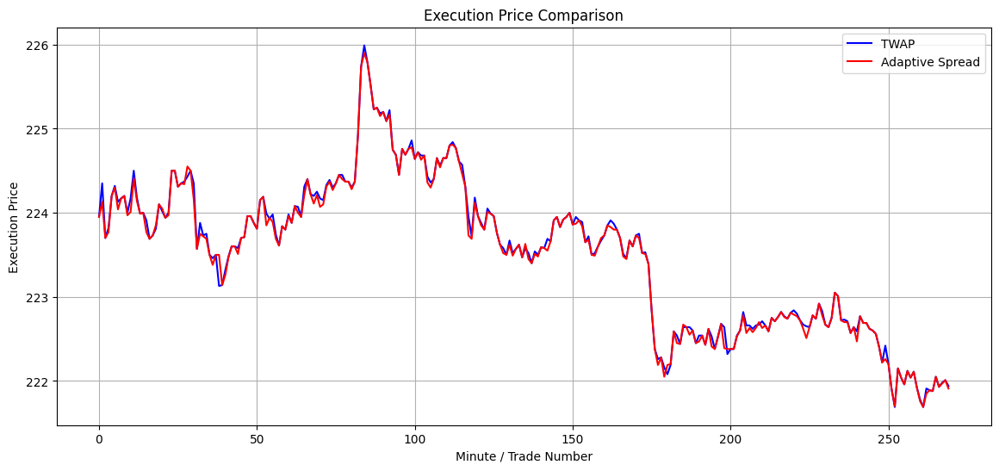

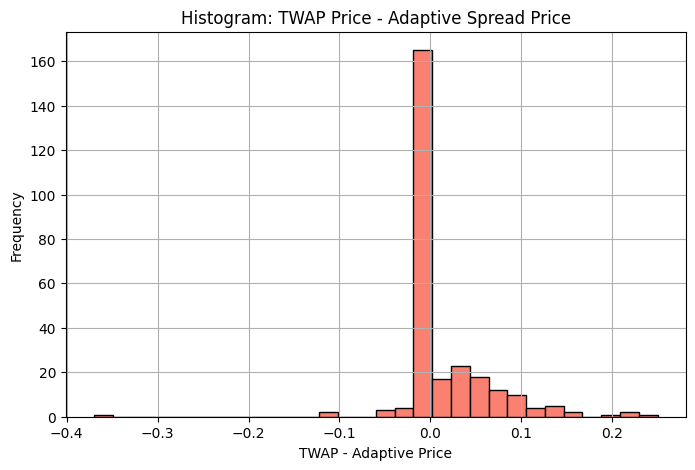

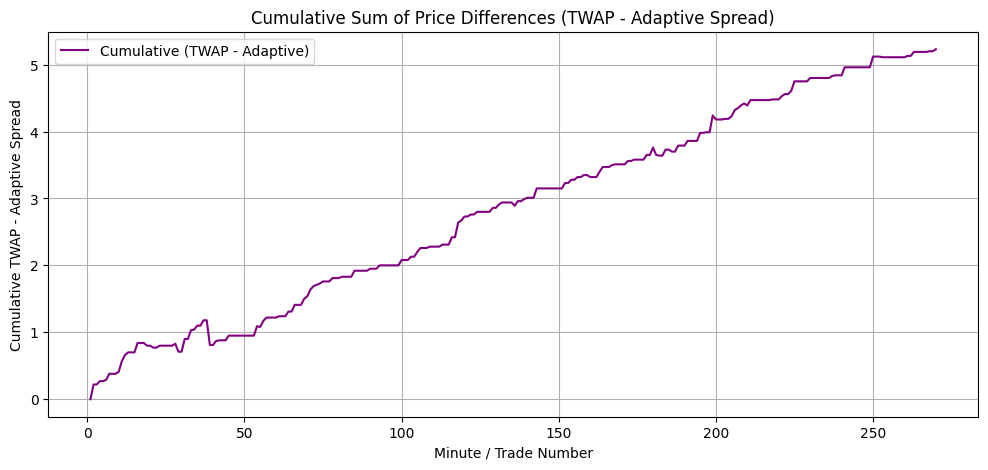

In [ ]:
# ============================================================
# TWAP vs ADAPTIVE SPREAD EXECUTION — FULL COMPARISON
# ============================================================

# -----------------------------
# 1️⃣ PARAMETERS / TOGGLES
# -----------------------------
TWAP_SIDE = "BUY"
# TWAP_SIDE = "SELL"

ROLLING_WINDOW = 500        # Number of rows for rolling spread
SPREAD_QUANTILE = 0.30      # 30% quantile threshold

# -----------------------------
# 2️⃣ EXECUTION PRICE COLUMN
# -----------------------------
if TWAP_SIDE == "BUY":
    execution_price_col = "AskPrice_1"
else:
    execution_price_col = "BidPrice_1"

# -----------------------------
# 3️⃣ ROLLING SPREAD THRESHOLD
# -----------------------------
train_read["RollingSpreadThreshold"] = (
    train_read["Spread"]
    .rolling(ROLLING_WINDOW)
    .quantile(SPREAD_QUANTILE)
)
train_read["RollingSpreadThreshold"].fillna(
    train_read["Spread"].quantile(SPREAD_QUANTILE),
    inplace=True
)

# -----------------------------
# 4️⃣ GROUP DATA BY MINUTE
# -----------------------------
train_read["Minute"] = train_read.index.floor("min")
minute_groups = train_read.groupby("Minute")

# ============================================================
# 5️⃣ TWAP BASELINE
# ============================================================
twap_prices = [group.iloc[0][execution_price_col] for minute, group in minute_groups]
twap_prices = pd.Series(twap_prices)

# ============================================================
# 6️⃣ ADAPTIVE SPREAD EXECUTION
# ============================================================
algo_prices = []

for minute, group in minute_groups:

    executed = False

    for idx, row in group.iterrows():
        if row["Spread"] <= row["RollingSpreadThreshold"]:
            algo_prices.append(row[execution_price_col])
            executed = True
            break

    # fallback if no trade during minute
    if not executed:
        algo_prices.append(group.iloc[-1][execution_price_col])

algo_prices = pd.Series(algo_prices)

# ============================================================
# 7️⃣ PRICE DIFFERENCE (TWAP - Adaptive)
# ============================================================
price_diff = twap_prices - algo_prices

# ============================================================
# 8️⃣ SUMMARY STATISTICS
# ============================================================
print("\n==============================")
print("TWAP vs Adaptive Spread Execution")
print("==============================")
print("Number of trades:", len(algo_prices))
print("TWAP avg price:", round(twap_prices.mean(),5))
print("Adaptive Spread avg price:", round(algo_prices.mean(),5))
print("Average difference (TWAP - Adaptive):", round(price_diff.mean(),5))
print("Std of differences:", round(price_diff.std(),5))
print("Min difference:", round(price_diff.min(),5))
print("Max difference:", round(price_diff.max(),5))

# ============================================================
# 9️⃣ PLOT: EXECUTION PRICE COMPARISON OVER MINUTES
# ============================================================
plt.figure(figsize=(14,6))
plt.plot(range(len(twap_prices)), twap_prices, label="TWAP", color="blue")
plt.plot(range(len(algo_prices)), algo_prices, label="Adaptive Spread", color="red")
plt.title("Execution Price Comparison")
plt.xlabel("Minute / Trade Number")
plt.ylabel("Execution Price")
plt.legend()
plt.grid(True)
plt.show()

# ============================================================
# 🔟 PLOT: HISTOGRAM OF (TWAP - Adaptive)
# ============================================================
plt.figure(figsize=(8,5))
plt.hist(price_diff, bins=30, color='salmon', edgecolor='black')
plt.title("Histogram: TWAP Price - Adaptive Spread Price")
plt.xlabel("TWAP - Adaptive Price")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

# ============================================================
# 1️⃣1️⃣ PLOT: CUMULATIVE SUM OF (TWAP - Adaptive)
# ============================================================
cum_diff = price_diff.cumsum()
plt.figure(figsize=(12,5))
plt.plot(range(1,len(cum_diff)+1), cum_diff.values, label="Cumulative (TWAP - Adaptive)", color="purple")
plt.title("Cumulative Sum of Price Differences (TWAP - Adaptive Spread)")
plt.xlabel("Minute / Trade Number")
plt.ylabel("Cumulative TWAP - Adaptive Spread")
plt.grid(True)
plt.legend()
plt.show()

/tmp/ipykernel_177/1318672081.py:19: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_read["RollingSpreadThreshold"].fillna(


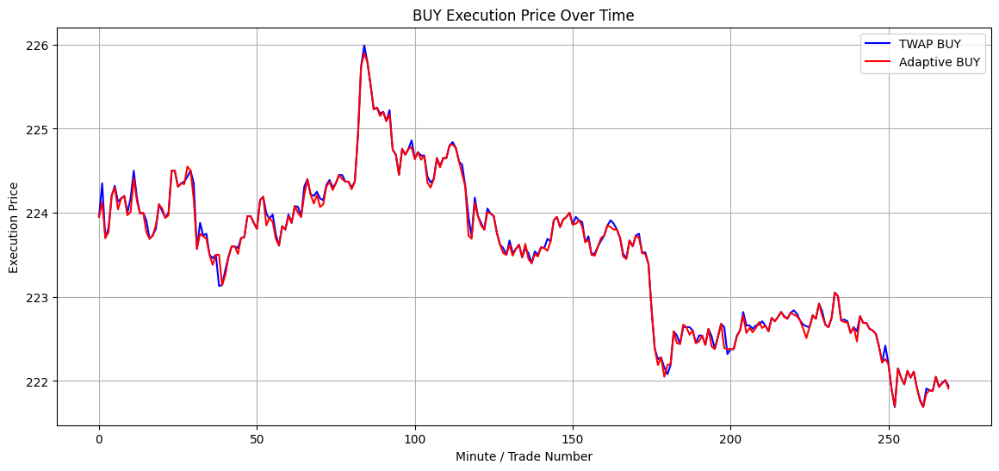

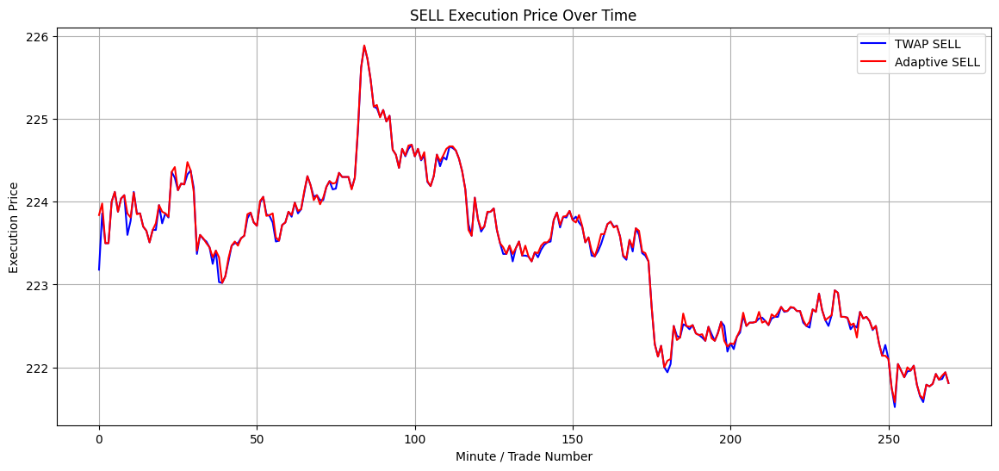

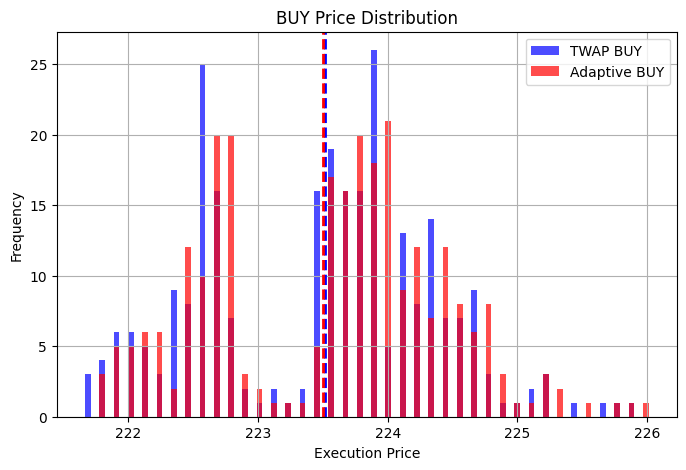

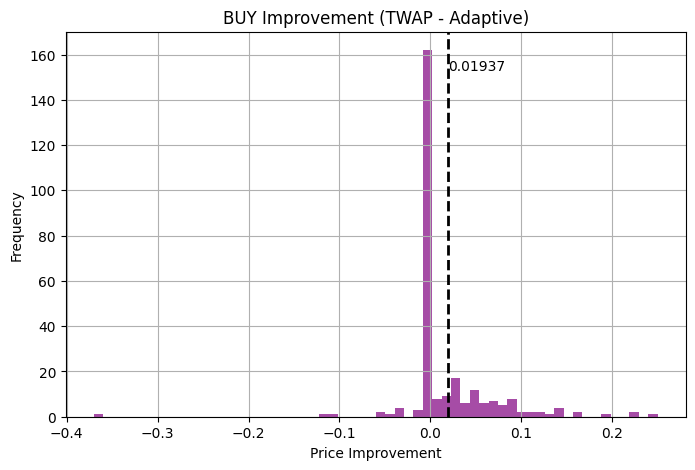

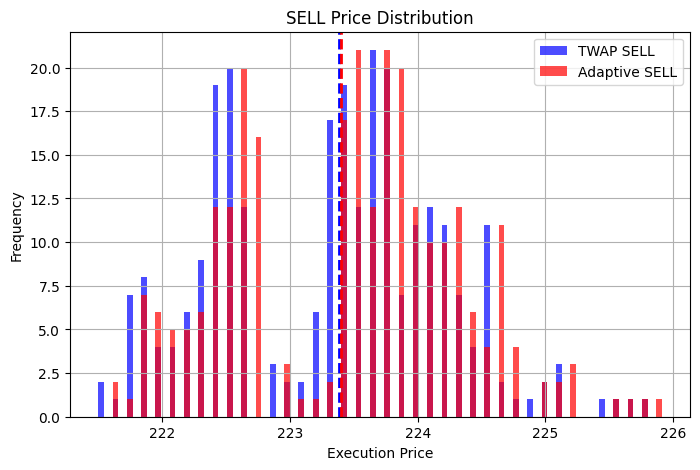

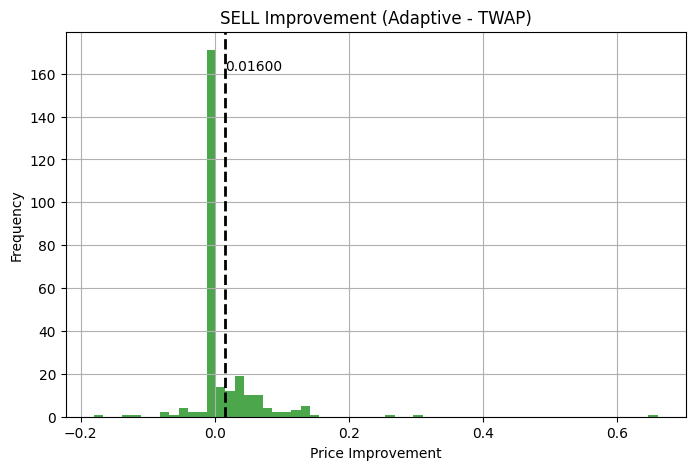

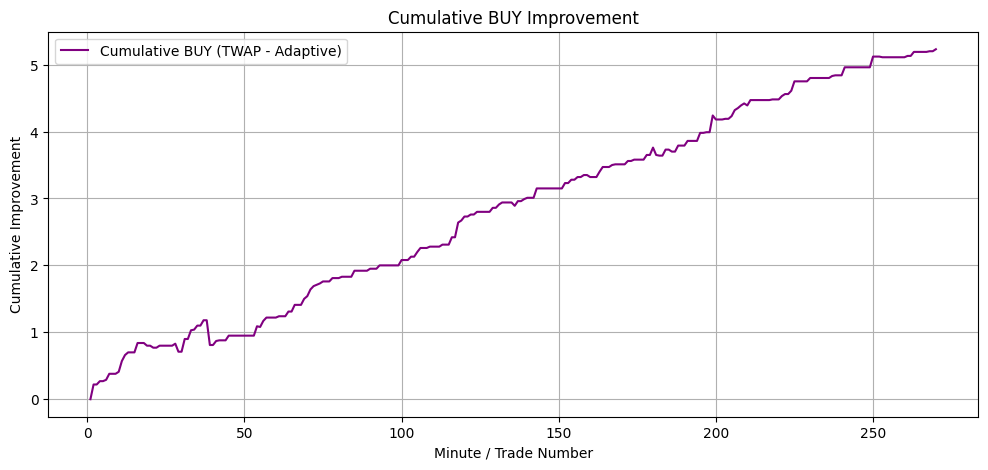

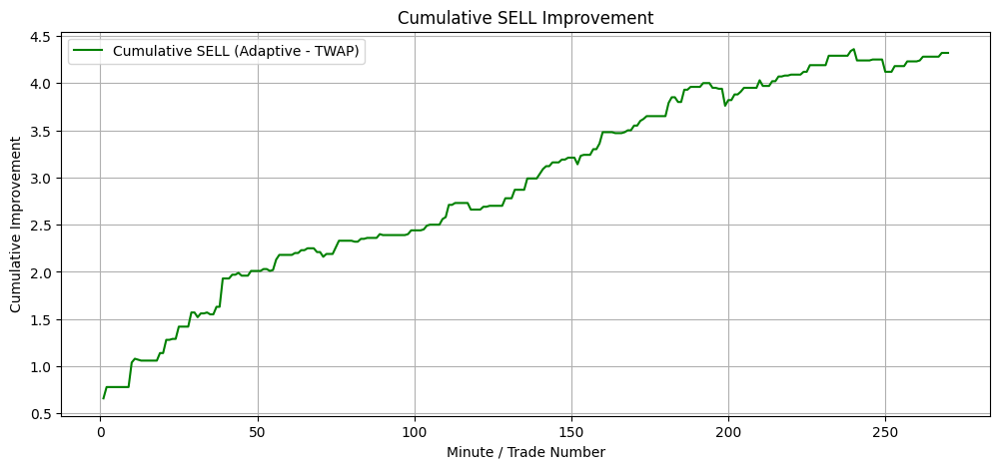

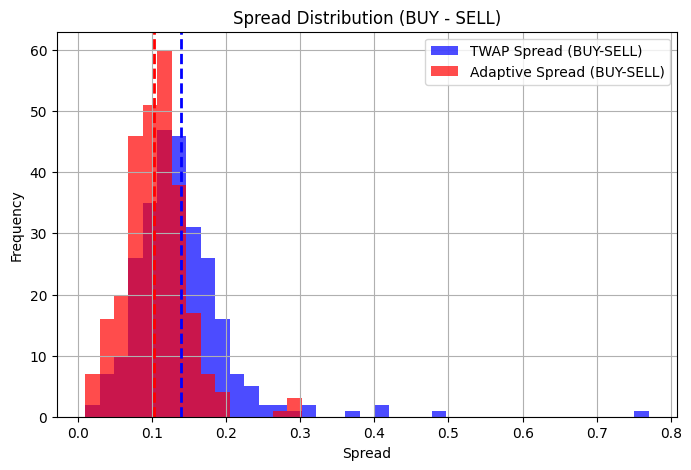

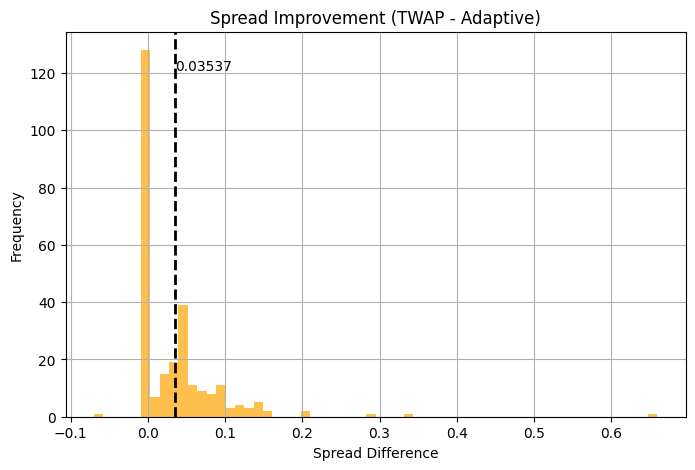


BUY IMPROVEMENT
count    270.000000
mean       0.019370
std        0.051034
min       -0.370000
25%        0.000000
50%        0.000000
75%        0.030000
max        0.250000
dtype: float64

SELL IMPROVEMENT
count    270.000000
mean       0.016000
std        0.058845
min       -0.180000
25%        0.000000
50%        0.000000
75%        0.020000
max        0.660000
dtype: float64

SPREAD IMPROVEMENT (BUY - SELL)
count    270.000000
mean       0.035370
std        0.061497
min       -0.070000
25%        0.000000
50%        0.010000
75%        0.050000
max        0.660000
dtype: float64

FINAL SUMMARY TABLE
                    Metric       TWAP   Adaptive  Improvement
0        Average Buy Price  223.51937  223.50000      0.01937
1       Average Sell Price  223.38048  223.39648     -0.01600
2  Average BUY-SELL Spread    0.13889    0.10352      0.03537


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ============================================================
# PARAMETERS
# ============================================================
ROLLING_WINDOW = 500
SPREAD_QUANTILE = 0.30

# ============================================================
# 1️⃣ ROLLING SPREAD THRESHOLD
# ============================================================
train_read["RollingSpreadThreshold"] = (
    train_read["Spread"]
    .rolling(ROLLING_WINDOW)
    .quantile(SPREAD_QUANTILE)
)
train_read["RollingSpreadThreshold"].fillna(
    train_read["Spread"].quantile(SPREAD_QUANTILE),
    inplace=True
)

# ============================================================
# 2️⃣ GROUP DATA BY MINUTE
# ============================================================
train_read["Minute"] = train_read.index.floor("min")
minute_groups = train_read.groupby("Minute")

# ============================================================
# 3️⃣ EXECUTION FUNCTION
# ============================================================
def run_execution(side):
    if side == "BUY":
        execution_price_col = "AskPrice_1"
    else:
        execution_price_col = "BidPrice_1"

    twap_prices = []
    adaptive_prices = []

    for minute, group in minute_groups:

        # TWAP
        twap_prices.append(group.iloc[0][execution_price_col])

        # Adaptive execution
        executed = False
        for idx, row in group.iterrows():
            if row["Spread"] <= row["RollingSpreadThreshold"]:
                adaptive_prices.append(row[execution_price_col])
                executed = True
                break
        if not executed:
            adaptive_prices.append(group.iloc[-1][execution_price_col])

    return pd.Series(twap_prices), pd.Series(adaptive_prices)

# ============================================================
# 4️⃣ RUN BUY AND SELL
# ============================================================
twap_buy, adaptive_buy = run_execution("BUY")
twap_sell, adaptive_sell = run_execution("SELL")

# ============================================================
# 5️⃣ IMPROVEMENTS
# ============================================================
buy_improvement = twap_buy - adaptive_buy
sell_improvement = adaptive_sell - twap_sell

# Spread definition: BUY - SELL
twap_spread = twap_buy - twap_sell
adaptive_spread = adaptive_buy - adaptive_sell

spread_improvement = twap_spread - adaptive_spread

# ============================================================
# 6️⃣ EXECUTION PRICE CURVES
# ============================================================
plt.figure(figsize=(14,6))
plt.plot(twap_buy.values, label="TWAP BUY", color="blue")
plt.plot(adaptive_buy.values, label="Adaptive BUY", color="red")
plt.title("BUY Execution Price Over Time")
plt.xlabel("Minute / Trade Number")
plt.ylabel("Execution Price")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(14,6))
plt.plot(twap_sell.values, label="TWAP SELL", color="blue")
plt.plot(adaptive_sell.values, label="Adaptive SELL", color="red")
plt.title("SELL Execution Price Over Time")
plt.xlabel("Minute / Trade Number")
plt.ylabel("Execution Price")
plt.legend()
plt.grid(True)
plt.show()

# ============================================================
# 7️⃣ BUY PRICE DISTRIBUTION (SIDE-BY-SIDE)
# ============================================================
plt.figure(figsize=(8,5))
bins = np.linspace(min(min(twap_buy), min(adaptive_buy)),
                   max(max(twap_buy), max(adaptive_buy)), 40)
plt.hist(twap_buy, bins=bins, label="TWAP BUY", color="blue", alpha=0.7, rwidth=0.4, align='left')
plt.hist(adaptive_buy, bins=bins, label="Adaptive BUY", color="red", alpha=0.7, rwidth=0.4, align='right')
plt.axvline(twap_buy.mean(), color="blue", linestyle="dashed", linewidth=2)
plt.axvline(adaptive_buy.mean(), color="red", linestyle="dashed", linewidth=2)
plt.title("BUY Price Distribution")
plt.xlabel("Execution Price")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.show()

# ============================================================
# 8️⃣ BUY IMPROVEMENT HISTOGRAM
# ============================================================
plt.figure(figsize=(8,5))
plt.hist(buy_improvement, bins=60, color="purple", alpha=0.7)
mean_val = buy_improvement.mean()
plt.axvline(mean_val, color="black", linestyle="dashed", linewidth=2)
plt.text(mean_val, plt.gca().get_ylim()[1]*0.9, f"{mean_val:.5f}", color="black")
plt.title("BUY Improvement (TWAP - Adaptive)")
plt.xlabel("Price Improvement")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

# ============================================================
# 9️⃣ SELL PRICE DISTRIBUTION (SIDE-BY-SIDE)
# ============================================================
plt.figure(figsize=(8,5))
bins = np.linspace(min(min(twap_sell), min(adaptive_sell)),
                   max(max(twap_sell), max(adaptive_sell)), 40)
plt.hist(twap_sell, bins=bins, label="TWAP SELL", color="blue", alpha=0.7, rwidth=0.4, align='left')
plt.hist(adaptive_sell, bins=bins, label="Adaptive SELL", color="red", alpha=0.7, rwidth=0.4, align='right')
plt.axvline(twap_sell.mean(), color="blue", linestyle="dashed", linewidth=2)
plt.axvline(adaptive_sell.mean(), color="red", linestyle="dashed", linewidth=2)
plt.title("SELL Price Distribution")
plt.xlabel("Execution Price")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.show()

# ============================================================
# 🔟 SELL IMPROVEMENT HISTOGRAM
# ============================================================
plt.figure(figsize=(8,5))
plt.hist(sell_improvement, bins=60, color="green", alpha=0.7)
mean_val = sell_improvement.mean()
plt.axvline(mean_val, color="black", linestyle="dashed", linewidth=2)
plt.text(mean_val, plt.gca().get_ylim()[1]*0.9, f"{mean_val:.5f}", color="black")
plt.title("SELL Improvement (Adaptive - TWAP)")
plt.xlabel("Price Improvement")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

# ============================================================
# 1️⃣1️⃣ CUMULATIVE IMPROVEMENT CURVES
# ============================================================
cum_buy = buy_improvement.cumsum()
plt.figure(figsize=(12,5))
plt.plot(range(1,len(cum_buy)+1), cum_buy.values, label="Cumulative BUY (TWAP - Adaptive)", color="purple")
plt.title("Cumulative BUY Improvement")
plt.xlabel("Minute / Trade Number")
plt.ylabel("Cumulative Improvement")
plt.grid(True)
plt.legend()
plt.show()

cum_sell = sell_improvement.cumsum()
plt.figure(figsize=(12,5))
plt.plot(range(1,len(cum_sell)+1), cum_sell.values, label="Cumulative SELL (Adaptive - TWAP)", color="green")
plt.title("Cumulative SELL Improvement")
plt.xlabel("Minute / Trade Number")
plt.ylabel("Cumulative Improvement")
plt.grid(True)
plt.legend()
plt.show()

# ============================================================
# 1️⃣2️⃣ SPREAD DISTRIBUTION (BUY - SELL)
# ============================================================
plt.figure(figsize=(8,5))
bins = np.linspace(min(min(twap_spread), min(adaptive_spread)),
                   max(max(twap_spread), max(adaptive_spread)), 40)
plt.hist(twap_spread, bins=bins, alpha=0.7, label="TWAP Spread (BUY-SELL)", color="blue")
plt.hist(adaptive_spread, bins=bins, alpha=0.7, label="Adaptive Spread (BUY-SELL)", color="red")
plt.axvline(twap_spread.mean(), color="blue", linestyle="dashed", linewidth=2)
plt.axvline(adaptive_spread.mean(), color="red", linestyle="dashed", linewidth=2)
plt.title("Spread Distribution (BUY - SELL)")
plt.xlabel("Spread")
plt.ylabel("Frequency")
plt.legend()
plt.grid(True)
plt.show()

# ============================================================
# 1️⃣3️⃣ SPREAD IMPROVEMENT HISTOGRAM
# ============================================================
plt.figure(figsize=(8,5))
plt.hist(spread_improvement, bins=60, color="orange", alpha=0.7)
mean_val = spread_improvement.mean()
plt.axvline(mean_val, color="black", linestyle="dashed", linewidth=2)
plt.text(mean_val, plt.gca().get_ylim()[1]*0.9, f"{mean_val:.5f}", color="black")
plt.title("Spread Improvement (TWAP - Adaptive)")
plt.xlabel("Spread Difference")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

# ============================================================
# 1️⃣4️⃣ SUMMARY STATISTICS
# ============================================================
print("\n==============================")
print("BUY IMPROVEMENT")
print(buy_improvement.describe())

print("\n==============================")
print("SELL IMPROVEMENT")
print(sell_improvement.describe())

print("\n==============================")
print("SPREAD IMPROVEMENT (BUY - SELL)")
print(spread_improvement.describe())

# ============================================================
# 1️⃣5️⃣ FINAL SUMMARY TABLE
# ============================================================
summary_table = pd.DataFrame({
    "Metric": [
        "Average Buy Price",
        "Average Sell Price",
        "Average BUY-SELL Spread"
    ],
    "TWAP": [
        twap_buy.mean(),
        twap_sell.mean(),
        twap_spread.mean()
    ],
    "Adaptive": [
        adaptive_buy.mean(),
        adaptive_sell.mean(),
        adaptive_spread.mean()
    ]
})

summary_table["Improvement"] = summary_table["TWAP"] - summary_table["Adaptive"]

print("\n==============================")
print("FINAL SUMMARY TABLE")
print("==============================")
print(summary_table.round(5))